In this notebook, we will try the process of implementing CNN with Keras in order to classify images.

I.   **Firstly**, we'll import useful packages.

II.   **Then**, we'll load the data, before visualize and preprocess it.

III.  **We'll try a simple CNN model** and then we will evaluate its performances.

IV.   **Finally,** we'll use techniques such as data augmentation, learning rate decay and dropout to increase our test F1.

# I. Let import all useful packages.

In [7]:
!pip install tensorflow_addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 7.1 MB/s 


In [8]:
import tensorflow
from tensorflow import keras
import tensorflow.keras.layers as Layers
import tensorflow.keras.activations as Actications
import tensorflow.keras.models as Models
import tensorflow.keras.optimizers as Optimizer
import tensorflow.keras.metrics as Metrics
import tensorflow.keras.utils as Utils
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import load_model, Model, Sequential
from tensorflow.keras.callbacks import TensorBoard
import tensorflow_addons as tfa
from tensorflow.keras.layers import GlobalAveragePooling2D, Input, Conv2D, MaxPool2D, Flatten, Dense, Dropout,BatchNormalization 
import os
import random
import datetime
import cv2
import numpy as np
import pandas as pd
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix as CM
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plot
import seaborn as sn
from sklearn.metrics import f1_score


Setting Fre GPU in this Google Colab notebook.


#I. Unzip the zip dataset.


In [6]:
!unzip 'image_classification.zip'

Kết quả truyền trực tuyến bị cắt bớt đến 5000 dòng cuối.
  inflating: seg_train/seg_train/mountain/7506.jpg  
  inflating: seg_train/seg_train/mountain/7537.jpg  
  inflating: seg_train/seg_train/mountain/7539.jpg  
  inflating: seg_train/seg_train/mountain/7551.jpg  
  inflating: seg_train/seg_train/mountain/7560.jpg  
  inflating: seg_train/seg_train/mountain/7565.jpg  
  inflating: seg_train/seg_train/mountain/7578.jpg  
  inflating: seg_train/seg_train/mountain/7581.jpg  
  inflating: seg_train/seg_train/mountain/7586.jpg  
  inflating: seg_train/seg_train/mountain/7647.jpg  
  inflating: seg_train/seg_train/mountain/7652.jpg  
  inflating: seg_train/seg_train/mountain/7654.jpg  
  inflating: seg_train/seg_train/mountain/7662.jpg  
  inflating: seg_train/seg_train/mountain/767.jpg  
  inflating: seg_train/seg_train/mountain/7672.jpg  
  inflating: seg_train/seg_train/mountain/7679.jpg  
  inflating: seg_train/seg_train/mountain/7681.jpg  
  inflating: seg_train/seg_train/mountain/7

# II. Load the data.

## About dataset.
This is image data of Natural Scenes around the world.
This Data contains around 25k images of size 150x150 distributed under 6 categories. {'buildings' -> 0, 'forest' -> 1, 'glacier' -> 2, 'mountain' -> 3, 'sea' -> 4, 'street' -> 5 }

The Train, Test and Prediction data is separated in each zip files. There are around 14k images in Train, 3k in Test.


Now, We need to prepare our data to feed into the model. There is a builtin method in Keras that can extract your images from folder.

Following is the gernalized functions used to extract data from the directory.

In [9]:
# Here's our 6 categories that we have to classify.
class_names = ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
class_names_label = {'buildings': 0,
                    'forest' : 1,
                    'glacier' : 2,
                    'mountain' : 3,
                    'sea' : 4,
                    'street' : 5
                    }
nb_classes = 6

## Loading the Data

We have to write a load_data function that load the training and test data ( which contain images and the labels) from the folder.

* **Load_data** function return **train_set** and **test_set**. Each set contains **images and labels**.
* Apply 2 augmentation transformations (**shear_range** = 0.2, **zoom_range** = 0.2), shuffle with seed = 8 and rescaling function( to [0, 1]) to **train_set.**
* Apply rescaling funtion to [0, 1]  to **test_set**, no shuffle.
* Batch size = 32.


In [10]:
def load_data(data_directories):
    IG=ImageDataGenerator(
                    rescale = 1/255,
                    shear_range = 0.2,
                    zoom_range = 0.2)
    training_set=IG.flow_from_directory(data_directories[0],
                                        target_size=(150,150),
                                        shuffle=True,
                                        batch_size=32,
                                        seed=8)
    testing_set=IG.flow_from_directory(data_directories[1],
                                        target_size=(150,150),
                                       shuffle=False,
                                       batch_size=32)

    return training_set, testing_set


data_directories = ['seg_train/seg_train/', 'seg_test/seg_test/']
train_dataset, test_dataset = load_data(data_directories)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


## Let's explore the dataset.
We can, for example, ask ourselves:

* How many training and testing examples do we have ?
* What is the size of the images ?
* What is the proportion of each observed category ?

As you see, The Training data is in shape of (Number of Training Images, Width of image, Height of image, Channel of image). This shape is very important. If you didnot resize the images to same size. It should be (No. of images,) shape. So, using this shape you cant feed the images to the model.


Print out:

*  Number of training examples.
*  Number of testing examples.
* Size of each image.



In [11]:
print('Number of training examples: {}'.format(train_dataset.samples))
print('Number of testing examples: {}'.format(test_dataset.samples))
print( 'Each image is of size: {}'.format(train_dataset.image_shape[:2]))

Number of training examples: 14034
Number of testing examples: 3000
Each image is of size: (150, 150)


Plot a pie chart of the proportion of each class.
You need to show the name and proportion of each class on the pie chart.


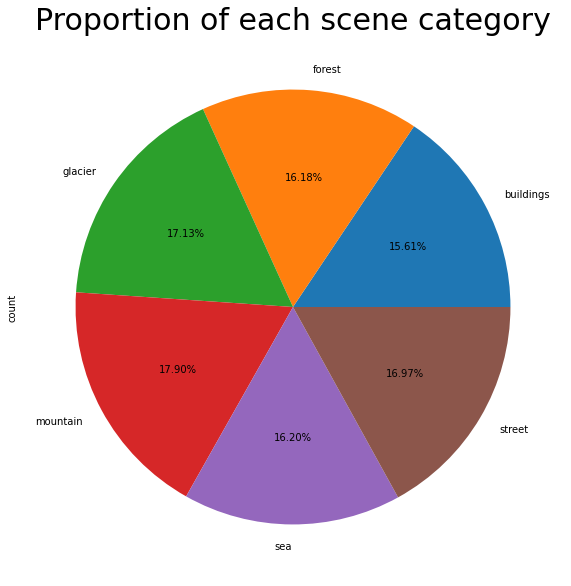

In [12]:
def plot_pie(train_dataset, class_names):
    list_of_class=list(train_dataset.classes)
    count_of_class=np.unique(train_dataset.classes, return_counts=True)[1]
    df=pd.DataFrame({'label':class_name, 'count':count_of_class})
    df=df.set_index('label')
    plot.figure(figsize=(10,10))
    df['count'].plot.pie(autopct='%.2f%%')
    plot.title('Proportion of each scene category', fontsize=30)
    plot.show()

class_name=list(train_dataset.class_indices.keys())
plot_pie(train_dataset, class_names)

Display the 36 random images from the training set.

* Each class contain 6 random images.
* Bellow the image, show the class it belongs to.


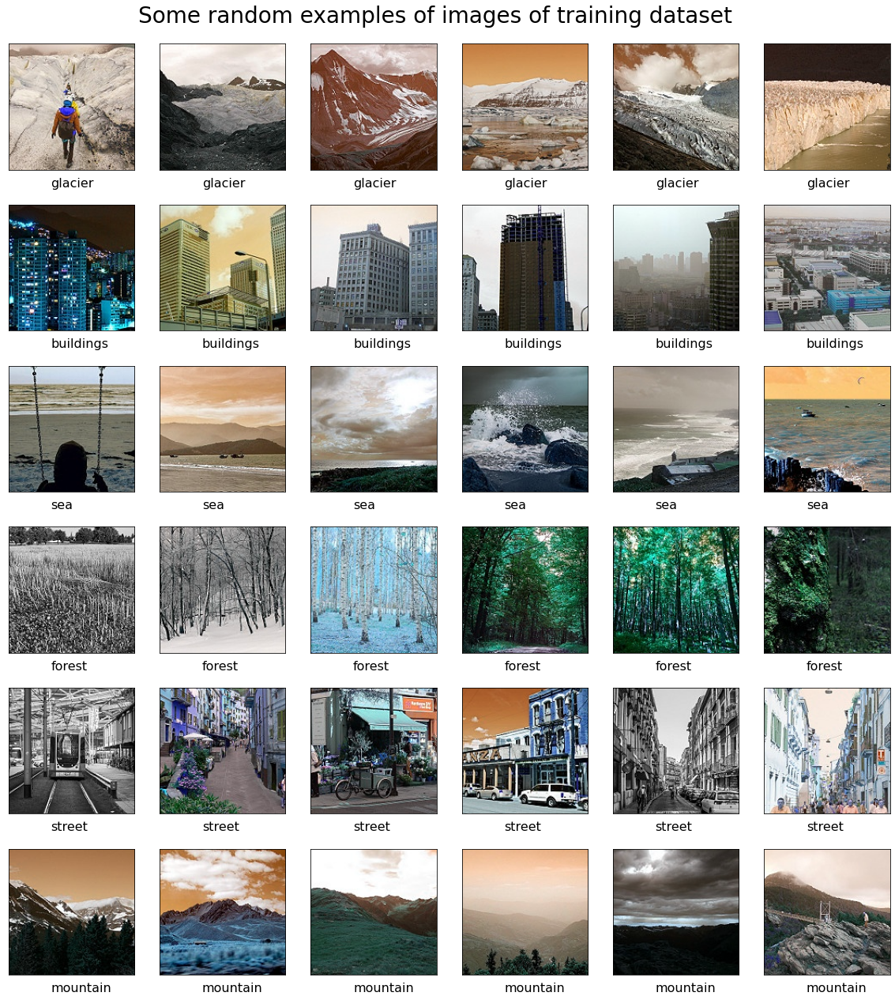

In [13]:
def visualize_image(train_directory):
    path=train_directory
    Labels=os.listdir(train_directory)
    fig, ax=plot.subplots(nrows=nb_classes, ncols=nb_classes, figsize=(20,20))
    fig.suptitle('Some random examples of images of training dataset', fontsize=28)
    fig.subplots_adjust(top=0.95)
    for i in range(nb_classes):
      path_i=path+Labels[i]
      pics=os.listdir(path_i)
      for j in range(6):
        pic=random.choice(pics)
        path_i_random_pic=path_i+'/'+pic
        pic_=cv2.imread(path_i_random_pic)
        ax[i,j].imshow(pic_)
        ax[i,j].axes.yaxis.set_visible(False)
        ax[i,j].axes.xaxis.set_visible(False)
        ax[i,j].text(50,170,Labels[i], fontsize=16)        
    plot.show()

train_directory = 'seg_train/seg_train/'
visualize_image(train_directory)

# III. Modelling
## There are some steps we need to finish:
* Build the model.

* Compile the model.

* Train / fit the data to the model.

* Evaluate the model on the testing set.


## Build the model
We can build an easy model composed of different layers such as:

* [Conv2D](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Conv2D).

* [MaxPooling2D:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/MaxPool2D) The images get smaller sized.

* [Flatten:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Flatten) Transforms the format of the images from a 2d-array to a 1d-array of 150 150 3 pixel values.

* [Relu:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/ReLU) given a value x, returns max(x, 0).

* [Softmax:](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Softmax) 6 neurons, probability that the image belongs to one of the classes.

* [Dense.](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dense)

* [Dropout.](https://www.tensorflow.org/api_docs/python/tf/keras/layers/Dropout)

**Buil a model, which contain these layers:**
- Layer 1: Conv2D, 8 filters, kernel_size = (3, 3), activation = 'relu', input_shape = image_shape, same padding.
- Layer 2: Conv2D, 16 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 3: MaxPooling2D, pooling size = (2, 2).
- Layer 4: Conv2D, 32 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 5: Conv2D, 64 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 6: MaxPooling2D, pooling size = (3, 3).
- Layer 7: Conv2D, 128 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 8: Conv2D, 256 filters, kernel_size = (3, 3), activation = 'relu', same padding.
- Layer 9: MaxPooling2D, pooling size = (5, 5).
- Layer 10: Flatten.
- Layer 11: Dense with number of unit = 100, activation = 'relu'.
- Layer 12: Dropout with probs = 0.5.
- Layer 13: Final dense with number of unit = number of class, activation = 'softmax'.



All the Conv2D and Dense layers are followed by a Batch Norm layer with customized configuration excepts from the last dense layer:

- momentum=0.95 
- epsilon=0.005
- beta_initializer = RandomNormal with mean = 0 and stddev = 0.05
- gammaa_initializer = Constant with value = 0.9


In [14]:
def create_model():

    input=Input(shape=train_dataset.image_shape)
    h=Conv2D(filters=8, kernel_size=(3,3), activation='relu', padding='SAME')(input)
    h=BatchNormalization(momentum=0.95, epsilon=0.005,
                         beta_initializer=tensorflow.keras.initializers.RandomNormal(mean=0, stddev= 0.05),
                         gamma_initializer=tensorflow.keras.initializers.Constant(0.9))(h)
    h=Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='SAME')(h)
    h=BatchNormalization(momentum=0.95, epsilon=0.005,
                         beta_initializer=tensorflow.keras.initializers.RandomNormal(mean=0, stddev= 0.05),
                         gamma_initializer=tensorflow.keras.initializers.Constant(0.9))(h)
    h=MaxPool2D(pool_size=(2,2))(h)
    h=Conv2D(filters=32, kernel_size=(3,3), activation='relu', padding='SAME')(h)
    h=BatchNormalization(momentum=0.95, epsilon=0.005,
                         beta_initializer=tensorflow.keras.initializers.RandomNormal(mean=0, stddev= 0.05),
                         gamma_initializer=tensorflow.keras.initializers.Constant(0.9))(h)
    h=Conv2D(filters=64, kernel_size=(3,3), activation='relu', padding='SAME')(h)
    h=BatchNormalization(momentum=0.95, epsilon=0.005,
                         beta_initializer=tensorflow.keras.initializers.RandomNormal(mean=0, stddev= 0.05),
                         gamma_initializer=tensorflow.keras.initializers.Constant(0.9))(h)
    h=MaxPool2D(pool_size=(3,3))(h)
    h=Conv2D(filters=128, kernel_size=(3,3), activation='relu', padding='SAME')(h)
    h=BatchNormalization(momentum=0.95, epsilon=0.005,
                         beta_initializer=tensorflow.keras.initializers.RandomNormal(mean=0, stddev= 0.05),
                         gamma_initializer=tensorflow.keras.initializers.Constant(0.9))(h)
    h=Conv2D(filters=256, kernel_size=(3,3), activation='relu', padding='SAME')(h)
    h=BatchNormalization(momentum=0.95, epsilon=0.005,
                         beta_initializer=tensorflow.keras.initializers.RandomNormal(mean=0, stddev= 0.05),
                         gamma_initializer=tensorflow.keras.initializers.Constant(0.9))(h)
    h=MaxPool2D(pool_size=(5,5))(h)
    h=Flatten()(h)
    h=Dense(units=100, activation='relu')(h)
    h=BatchNormalization(momentum=0.95, epsilon=0.005,
                         beta_initializer=tensorflow.keras.initializers.RandomNormal(mean=0, stddev= 0.05),
                         gamma_initializer=tensorflow.keras.initializers.Constant(0.9))(h)
    h=Dropout(rate=0.5)(h)
    output=Dense(units=nb_classes, activation='softmax')(h)
    model=Model(inputs=input, outputs=output)

      
    return model
model = create_model()

**Compile the model. Then print out the model summary.**
* [Compile](https://keras.io/models/model/#compile) the model with Adam Optimizaer, lr = 1e-4, categorical-crossentroy loss and "[F1 score](https://github.com/tensorflow/addons/issues/825)" as metric.
* Print out the model F1.

In [15]:
import tensorflow
def optimize(model):
    model.compile(optimizer=tensorflow.keras.optimizers.Adam(learning_rate=1e-4), 
                  loss='CategoricalCrossentropy', 
                  metrics=[tfa.metrics.F1Score (num_classes=6, average='micro')])
    return model

model = optimize(model)
print(model.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 150, 150, 8)       224       
                                                                 
 batch_normalization (BatchN  (None, 150, 150, 8)      32        
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 150, 16)      1168      
                                                                 
 batch_normalization_1 (Batc  (None, 150, 150, 16)     64        
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 75, 75, 16)       0     

**Setup callback.**
* Create the [tensorboard callback](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks) to save the logs.
* Create the [checkpoint callback](https://machinelearningmastery.com/check-point-deep-learning-models-keras/) to save the checkpoint with the best F1 after each epoch. 
* Create the [ReduceLROnPlateau callback](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ReduceLROnPlateau) to reduce learning rate when the validation F1 score has stopped improving with the factor of 0.1 and patience = 2.

In [16]:
def callback_model(checkpoint_name, logs_name):
    checkpoint = ModelCheckpoint(checkpoint_name,
                                 monitor='f1_score',
                                 mode = 'max',
                                 save_best_only=True)
    tensorboard_callback = tensorflow.keras.callbacks.TensorBoard(log_dir=logs_name)
    ReduceLROnPlateau=tensorflow.keras.callbacks.ReduceLROnPlateau(
                        monitor='val_f1_score',
                        factor=0.1,
                        patience=2)
    callbacks_list=[checkpoint, tensorboard_callback, ReduceLROnPlateau]

    return callbacks_list

checkpoint_name = 'weights.best.hdf5'
logs_name = 'training_logs'
callbacks_list = callback_model(checkpoint_name, logs_name)

**Train the model.** 
* Train the model with 10 epochs, generator = train_dataset, validataion_data = test_dataset.
* Return the model with best-checkpoint weights.


In [17]:
def train_model(model, callbacks_list):
    model.fit(train_dataset, epochs=10, validation_data=test_dataset, callbacks=callbacks_list)
    model=load_model(checkpoint_name)
    return model
    
model = train_model(model, callbacks_list)

Epoch 1/10
439/439 [==============================] - 97s 191ms/step - loss: 1.1634 - f1_score: 0.5762 - val_loss: 0.7834 - val_f1_score: 0.7207 - lr: 1.0000e-04
Epoch 2/10
439/439 [==============================] - 83s 190ms/step - loss: 0.8100 - f1_score: 0.7054 - val_loss: 0.6490 - val_f1_score: 0.7693 - lr: 1.0000e-04
Epoch 3/10
439/439 [==============================] - 83s 189ms/step - loss: 0.6880 - f1_score: 0.7557 - val_loss: 0.5753 - val_f1_score: 0.7973 - lr: 1.0000e-04
Epoch 4/10
439/439 [==============================] - 83s 189ms/step - loss: 0.5995 - f1_score: 0.7882 - val_loss: 0.5278 - val_f1_score: 0.8183 - lr: 1.0000e-05
Epoch 5/10
439/439 [==============================] - 83s 189ms/step - loss: 0.5764 - f1_score: 0.7967 - val_loss: 0.5183 - val_f1_score: 0.8187 - lr: 1.0000e-05
Epoch 6/10
439/439 [==============================] - 83s 188ms/step - loss: 0.5639 - f1_score: 0.7991 - val_loss: 0.5296 - val_f1_score: 0.8177 - lr: 1.0000e-06
Epoch 7/10
439/439 [========

[Show the tensorboard](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks) in the notebook.

In [18]:
## TYPE YOUR CODE for task 12 here:
!kill 2410
%load_ext tensorboard
%tensorboard --logdir=/content/training_logs serve


/bin/bash: line 0: kill: (2410) - No such process


<IPython.core.display.Javascript object>

**Prediction on test set.**
* Complete the get_prediction_classes function.
* Print out the test F1. 

In [19]:
def get_prediction_classes(model, prediction_dataset):
    pred=model.predict(prediction_dataset)
    pred=np.array(pred)
    test_predictions=pred.argmax(axis=1)
    test_groundtruths=prediction_dataset.classes
    return test_predictions, test_groundtruths

test_predictions, test_groundtruths=get_prediction_classes(model, test_dataset)
F1_score=f1_score(np.array(test_groundtruths),np.array(test_predictions), average='micro')
print('F1 score: ', F1_score)

F1 score:  0.823


Perform the predicted result on test set using confusion matrix.
Remember to show the class name in the confusion matrix. 

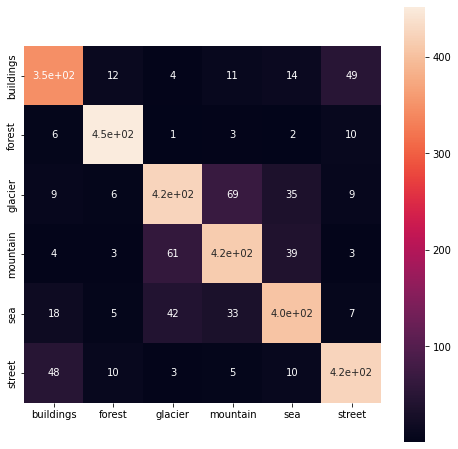

In [20]:
def plot_confusion_matrix(predictions, groundtruth, class_names):
    x_axis_labels=class_names
    y_axis_labels=class_names
    plot.figure(figsize=(8,8))
    sn.heatmap(confusion_matrix(test_groundtruths,test_predictions),xticklabels=x_axis_labels, yticklabels=y_axis_labels, annot=True, square=True)
    plot.show()
plot_confusion_matrix(test_predictions, test_groundtruths, class_names)

**Model finetuning - fine tune the model using some of these approachs:**
* Increase max epochs, change batch size.
* Play around with CNN, Dense and Dropoutlayers (add/# units/etc).
* Increase data augmentation transformations.
* Try to use a [pretrained model](https://www.tensorflow.org/api_docs/python/tf/keras/applications) on Keras.

Requirement: The val_best_F1 should be higher than 87%.

In this exercise, we use "EfficientNetB0" training model, combined with image augmentation. We also use EarlyStopping to improve f1_score of validation dataset.


In [21]:
def data_for_pretrain(data_directories):

    IG=ImageDataGenerator(
                    shear_range = 0.2,
                    zoom_range = 0.2)
    training_set=IG.flow_from_directory(data_directories[0],
                                        target_size=(224,224),
                                        shuffle=True,
                                        batch_size=32,
                                        seed=8)
    testing_set=IG.flow_from_directory(data_directories[1],
                                        target_size=(224,224),
                                       shuffle=False,
                                       batch_size=32)

    return training_set, testing_set


data_directories = ['seg_train/seg_train/', 'seg_test/seg_test/']
train_dataset_pretrain, test_dataset_pretrain = data_for_pretrain(data_directories)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.


Create image augumentation layers.


In [22]:
img_augmentation = Sequential(
    [
        tensorflow.keras.layers.RandomRotation(factor=0.15),
        tensorflow.keras.layers.RandomTranslation(height_factor=0.1, width_factor=0.1),
        tensorflow.keras.layers.RandomFlip(),
        tensorflow.keras.layers.RandomContrast(factor=0.1),
    ]
)

Create and combine model EfficientNetB0 with img_augmentation


In [23]:
from tensorflow.keras.applications import EfficientNetB0

inputs = Input(shape=train_dataset_pretrain.image_shape)
x = img_augmentation(inputs)
pretrain_model = EfficientNetB0(include_top=False, input_tensor=x, weights='imagenet')
pretrain_model.trainable=True
x = tensorflow.keras.layers.GlobalAveragePooling2D()(pretrain_model.output)
x = BatchNormalization()(x)
x = Dropout(rate=0.2)(x)
outputs = Dense(6, activation="softmax")(x)
pretrain_model = tensorflow.keras.Model(inputs=inputs, outputs=outputs)

16719872/16705208 [==============================] - 0s 0us/step


In [24]:
pretrain_model=optimize(pretrain_model)
checkpoint_name1 = 'weights1.best.hdf5'
logs_name1 = 'training_logs1'
callbacks_list1 = callback_model(checkpoint_name1, logs_name1)
pretrain_model.fit(train_dataset_pretrain, epochs=20, validation_data=test_dataset_pretrain, callbacks=callbacks_list1)
pretrain_model=load_model(checkpoint_name1)


Epoch 1/20
439/439 [==============================] - 180s 389ms/step - loss: 0.7115 - f1_score: 0.7515 - val_loss: 0.3393 - val_f1_score: 0.8783 - lr: 1.0000e-04
Epoch 2/20
439/439 [==============================] - 167s 380ms/step - loss: 0.3988 - f1_score: 0.8599 - val_loss: 0.2678 - val_f1_score: 0.9090 - lr: 1.0000e-04
Epoch 3/20
439/439 [==============================] - 167s 379ms/step - loss: 0.3221 - f1_score: 0.8859 - val_loss: 0.2474 - val_f1_score: 0.9097 - lr: 1.0000e-04
Epoch 4/20
439/439 [==============================] - 166s 379ms/step - loss: 0.2778 - f1_score: 0.9007 - val_loss: 0.2469 - val_f1_score: 0.9137 - lr: 1.0000e-05
Epoch 5/20
439/439 [==============================] - 166s 379ms/step - loss: 0.2720 - f1_score: 0.9012 - val_loss: 0.2325 - val_f1_score: 0.9147 - lr: 1.0000e-05
Epoch 6/20
439/439 [==============================] - 166s 378ms/step - loss: 0.2649 - f1_score: 0.9065 - val_loss: 0.2352 - val_f1_score: 0.9140 - lr: 1.0000e-06
Epoch 7/20
439/439 [==

Evaluate model on test dataset


In [25]:
test_predictions1, test_groundtruths1=get_prediction_classes(pretrain_model, test_dataset_pretrain)
F1_score1=f1_score(np.array(test_groundtruths1),np.array(test_predictions1), average='micro')
print('F1 score: ', F1_score1)

F1 score:  0.911


Plot confusion matrix


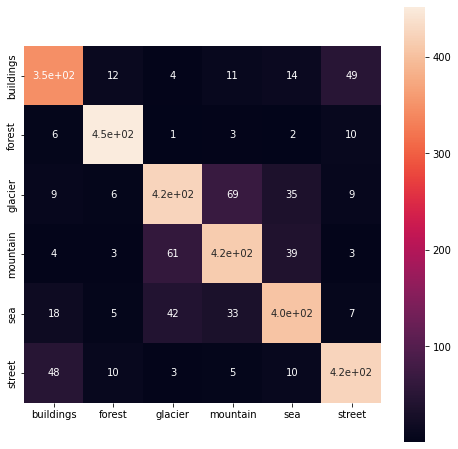

In [26]:
def plot_confusion_matrix(predictions, groundtruth, class_names):
    x_axis_labels=class_names
    y_axis_labels=class_names
    plot.figure(figsize=(8,8))
    sn.heatmap(confusion_matrix(test_groundtruths,test_predictions),xticklabels=x_axis_labels, yticklabels=y_axis_labels, annot=True, square=True)
    plot.show()
plot_confusion_matrix(test_predictions1, test_groundtruths1, class_names)

### **Conclusion: We find that using the pretrain model results in a significantly higher accuracy (f1_socre).**